zsh:1: command not found: mamba


In [9]:
!pip install pyalex


DEPRECATION: textract 1.6.5 has a non-standard dependency specifier extract-msg<=0.29.*. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of textract or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [49]:
# https://openalex.org/

from pyalex import Works, Authors, Sources, Institutions, Concepts, Publishers, Funders
import pyalex
pyalex.config.email = "maximilian.noichl@uni-bamberg.de"

from itertools import chain
from tqdm.auto import tqdm

from compress_pickle import dump, load



In [3]:
from pyalex import Works
import pandas as pd


# https://openalex.org/works?page=1&filter=default.search%3A%22Personality%22%20AND%20%22Life%20Outcomes%22
# Create a query with the specified search terms
query = Works().search(['"Personality" AND "Life outcomes"']).filter(publication_year=">2020")

records= []
for record in chain(*query.paginate(per_page=99,n_max=None)):
    records.append(record)
    print(len(records))



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [24]:
df = pd.DataFrame(records)
df

,id,doi,title,display_name,relevance_score,publication_year,publication_date,ids,language,primary_location,...,versions,referenced_works_count,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date
0,https://openalex.org/W4283078132,https://doi.org/10.1038/s41598-022-14666-0,Childhood temperament and adulthood personalit...,Childhood temperament and adulthood personalit...,126.031425,2022,2022-06-18,{'openalex': 'https://openalex.org/W4283078132...,en,"{'is_oa': True, 'landing_page_url': 'https://d...",...,[],56,"[https://openalex.org/W1570365978, https://ope...","[https://openalex.org/W4288435620, https://ope...",https://api.openalex.org/works/W4283078132/ngrams,"{'Debate': [0], 'has': [1], 'long': [2], 'surr...",https://api.openalex.org/works?filter=cites:W4...,"[{'year': 2024, 'cited_by_count': 3}, {'year':...",2024-05-11T19:42:45.376435,2022-06-19
1,https://openalex.org/W4285589482,https://doi.org/10.1177/08902070221111857,Do the Big Five personality traits interact to...,Do the Big Five personality traits interact to...,102.571180,2022,2022-07-15,{'openalex': 'https://openalex.org/W4285589482...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,[],101,"[https://openalex.org/W1513618424, https://ope...","[https://openalex.org/W4385429968, https://ope...",https://api.openalex.org/works/W4285589482/ngrams,"{'Personality': [0, 65], 'researchers': [1], '...",https://api.openalex.org/works?filter=cites:W4...,"[{'year': 2024, 'cited_by_count': 1}, {'year':...",2024-05-25T07:13:22.110919,2022-07-16
2,https://openalex.org/W4220720466,https://doi.org/10.1016/j.intell.2022.101631,The claim that personality is more important t...,The claim that personality is more important t...,96.486790,2022,2022-05-01,{'openalex': 'https://openalex.org/W4220720466...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,[],54,"[https://openalex.org/W1484965407, https://ope...","[https://openalex.org/W648995381, https://open...",https://api.openalex.org/works/W4220720466/ngrams,"{'We': [0, 26, 99], 'conduct': [1], 'a': [2], ...",https://api.openalex.org/works?filter=cites:W4...,"[{'year': 2024, 'cited_by_count': 1}, {'year':...",2024-05-17T03:00:30.001947,2022-04-03
3,https://openalex.org/W4382539535,https://doi.org/10.1037/pspp0000472,Do changes in personality predict life outcomes?,Do changes in personality predict life outcomes?,86.285965,2023,2023-12-01,{'openalex': 'https://openalex.org/W4382539535...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,[],0,[],"[https://openalex.org/W4256036313, https://ope...",https://api.openalex.org/works/W4382539535/ngrams,"{'The': [0, 65], 'Big': [1, 86, 211], 'Five': ...",https://api.openalex.org/works?filter=cites:W4...,"[{'year': 2024, 'cited_by_count': 4}]",2024-05-28T08:30:36.412560,2023-06-30
4,https://openalex.org/W4226288825,https://doi.org/10.1037/pspp0000386,A mega-analysis of personality prediction: Rob...,A mega-analysis of personality prediction: Rob...,79.259270,2022,2022-03-01,{'openalex': 'https://openalex.org/W4226288825...,en,"{'is_oa': True, 'landing_page_url': 'https://d...",...,[],57,"[https://openalex.org/W1100159290, https://ope...","[https://openalex.org/W4206042385, https://ope...",https://api.openalex.org/works/W4226288825/ngrams,"{'Decades': [0], 'of': [1, 15, 36, 60, 91, 169...",https://api.openalex.org/works?filter=cites:W4...,"[{'year': 2024, 'cited_by_count': 9}, {'year':...",2024-05-25T00:59:00.230821,2022-05-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1692,https://openalex.org/W4231650703,https://doi.org/10.17760/d20316474,Changing the narrative,Changing the narrative,0.051179,2021,2021-05-10,{'openalex': 'https://openalex.org/W4231650703...,en,"{'is_oa': True, 'landing_page_url': 'https://d...",...,[],0,[],"[https://openalex.org/W2389579140, https://ope...",https://api.openalex.org/works/W4231650703/ngrams,"{'Despite': [0], 'more': [1], 

In [86]:
all_referenced_works = [x for y in df['referenced_works'] for x in y]


# all_unique_referenced_works = list(set(all_referenced_works))

# from collections import Counter

# def remove_less_frequent_items(lst, n):
#     counts = Counter(lst)
#     return [item for item in lst if counts[item] > n]

# # Set to 0 for full set:
# n = 0
# filtered_referenced_works = remove_less_frequent_items(all_referenced_works, n) # remove 
# print(len(filtered_referenced_works))

filtered_referenced_works = list(set(filtered_referenced_works)) #remove duplicates from download list.
additional_works_to_download = [x for x in filtered_referenced_works if x not in  df['id']]



all_aditional_records =[]
block_len = 99
# Loop in blocks of 50
for i in tqdm(range(0, len(additional_works_to_download), block_len)):
    sublist = additional_works_to_download[i:i+block_len]
    ID_str = "|".join([x.replace('https://openalex.org/','') for  x in sublist])
    record_list = Works().filter(openalex_id=ID_str).get(per_page=block_len)
    print(len(record_list))
    for this_record in record_list:
        all_aditional_records.append(this_record)



25698


  0%|          | 1/260 [00:02<09:00,  2.09s/it]

93


  1%|          | 2/260 [00:04<08:32,  1.99s/it]

91


  1%|          | 3/260 [00:06<08:46,  2.05s/it]

98


  2%|▏         | 4/260 [00:07<08:26,  1.98s/it]

98


  2%|▏         | 5/260 [00:09<08:24,  1.98s/it]

99


  2%|▏         | 6/260 [00:11<08:18,  1.96s/it]

99


  3%|▎         | 7/260 [00:13<08:04,  1.91s/it]

97


  3%|▎         | 8/260 [00:15<08:26,  2.01s/it]

99


  3%|▎         | 9/260 [00:17<08:02,  1.92s/it]

99


  4%|▍         | 10/260 [00:19<07:41,  1.85s/it]

97


  4%|▍         | 11/260 [00:21<07:34,  1.83s/it]

99


  5%|▍         | 12/260 [00:23<07:41,  1.86s/it]

99


  5%|▌         | 13/260 [00:25<07:47,  1.89s/it]

94


  5%|▌         | 14/260 [00:27<08:01,  1.96s/it]

99


  6%|▌         | 15/260 [00:29<08:00,  1.96s/it]

97


  6%|▌         | 16/260 [00:31<07:57,  1.96s/it]

99


  7%|▋         | 17/260 [00:33<08:21,  2.06s/it]

99


  7%|▋         | 18/260 [00:35<08:41,  2.16s/it]

98


  7%|▋         | 19/260 [00:37<08:19,  2.07s/it]

98


  8%|▊         | 20/260 [00:40<08:54,  2.23s/it]

99


  8%|▊         | 21/260 [00:42<09:04,  2.28s/it]

99


  8%|▊         | 22/260 [00:44<08:55,  2.25s/it]

98


  9%|▉         | 23/260 [00:46<08:39,  2.19s/it]

98


  9%|▉         | 24/260 [00:48<08:19,  2.11s/it]

98


 10%|▉         | 25/260 [00:50<08:07,  2.08s/it]

99


 10%|█         | 26/260 [00:52<07:56,  2.04s/it]

99


 10%|█         | 27/260 [00:54<07:22,  1.90s/it]

99


 11%|█         | 28/260 [00:56<07:18,  1.89s/it]

98


 11%|█         | 29/260 [00:57<07:11,  1.87s/it]

99


 12%|█▏        | 30/260 [01:00<07:43,  2.01s/it]

99


 12%|█▏        | 31/260 [01:02<07:38,  2.00s/it]

97


 12%|█▏        | 32/260 [01:04<07:29,  1.97s/it]

99


 13%|█▎        | 33/260 [01:06<07:39,  2.02s/it]

99


 13%|█▎        | 34/260 [01:08<07:46,  2.06s/it]

98


 13%|█▎        | 35/260 [01:10<07:50,  2.09s/it]

99


 14%|█▍        | 36/260 [01:12<07:38,  2.05s/it]

98


 14%|█▍        | 37/260 [01:14<07:17,  1.96s/it]

98


 15%|█▍        | 38/260 [01:16<07:24,  2.00s/it]

99


 15%|█▌        | 39/260 [01:18<07:21,  2.00s/it]

99


 15%|█▌        | 40/260 [01:20<06:57,  1.90s/it]

99


 16%|█▌        | 41/260 [01:21<06:37,  1.81s/it]

98


 16%|█▌        | 42/260 [01:24<07:15,  2.00s/it]

99


 17%|█▋        | 43/260 [01:25<07:03,  1.95s/it]

98


 17%|█▋        | 44/260 [01:27<06:51,  1.91s/it]

98


 17%|█▋        | 45/260 [01:29<06:43,  1.88s/it]

96


 18%|█▊        | 46/260 [01:31<06:40,  1.87s/it]

97


 18%|█▊        | 47/260 [01:34<07:35,  2.14s/it]

99


 18%|█▊        | 48/260 [01:35<07:07,  2.01s/it]

96


 19%|█▉        | 49/260 [01:37<07:01,  2.00s/it]

99


 19%|█▉        | 50/260 [01:40<07:07,  2.04s/it]

99


 20%|█▉        | 51/260 [01:41<06:50,  1.96s/it]

98


 20%|██        | 52/260 [01:43<06:46,  1.96s/it]

98


 20%|██        | 53/260 [01:45<06:42,  1.95s/it]

98


 21%|██        | 54/260 [01:47<06:51,  2.00s/it]

98


 21%|██        | 55/260 [01:49<06:45,  1.98s/it]

97


 22%|██▏       | 56/260 [01:51<06:42,  1.97s/it]

98


 22%|██▏       | 57/260 [01:53<06:26,  1.91s/it]

98


 22%|██▏       | 58/260 [01:55<06:51,  2.04s/it]

99


 23%|██▎       | 59/260 [01:57<06:37,  1.98s/it]

99


 23%|██▎       | 60/260 [01:59<06:34,  1.97s/it]

99


 23%|██▎       | 61/260 [02:01<06:33,  1.98s/it]

99


 24%|██▍       | 62/260 [02:03<06:37,  2.01s/it]

99


 24%|██▍       | 63/260 [02:05<06:38,  2.02s/it]

99


 25%|██▍       | 64/260 [02:07<06:21,  1.95s/it]

99


 25%|██▌       | 65/260 [02:09<06:37,  2.04s/it]

99


 25%|██▌       | 66/260 [02:11<06:31,  2.02s/it]

98


 26%|██▌       | 67/260 [02:13<06:28,  2.01s/it]

98


 26%|██▌       | 68/260 [02:15<06:40,  2.09s/it]

98


 27%|██▋       | 69/260 [02:17<06:20,  1.99s/it]

99


 27%|██▋       | 70/260 [02:19<06:14,  1.97s/it]

98


 27%|██▋       | 71/260 [02:21<06:00,  1.91s/it]

97


 28%|██▊       | 72/260 [02:23<05:58,  1.91s/it]

99


 28%|██▊       | 73/260 [02:25<06:03,  1.94s/it]

96


 28%|██▊       | 74/260 [02:27<05:56,  1.92s/it]

98


 29%|██▉       | 75/260 [02:29<05:59,  1.94s/it]

99


 29%|██▉       | 76/260 [02:31<05:56,  1.94s/it]

99


 30%|██▉       | 77/260 [02:33<06:01,  1.97s/it]

97


 30%|███       | 78/260 [02:35<06:03,  2.00s/it]

99


 30%|███       | 79/260 [02:36<05:46,  1.92s/it]

99


 31%|███       | 80/260 [02:39<06:39,  2.22s/it]

98


 31%|███       | 81/260 [02:42<07:08,  2.40s/it]

99


 32%|███▏      | 82/260 [02:44<06:47,  2.29s/it]

99


 32%|███▏      | 83/260 [02:46<06:29,  2.20s/it]

98


 32%|███▏      | 84/260 [02:48<06:07,  2.09s/it]

99


 33%|███▎      | 85/260 [02:50<06:11,  2.12s/it]

99


 33%|███▎      | 86/260 [02:53<06:47,  2.34s/it]

97


 33%|███▎      | 87/260 [02:56<06:50,  2.37s/it]

98


 34%|███▍      | 88/260 [02:57<06:14,  2.18s/it]

96


 34%|███▍      | 89/260 [02:59<05:58,  2.10s/it]

99


 35%|███▍      | 90/260 [03:01<05:41,  2.01s/it]

99


 35%|███▌      | 91/260 [03:03<05:29,  1.95s/it]

99


 35%|███▌      | 92/260 [03:04<05:12,  1.86s/it]

99


 36%|███▌      | 93/260 [03:07<05:23,  1.93s/it]

99


 36%|███▌      | 94/260 [03:09<05:23,  1.95s/it]

99


 37%|███▋      | 95/260 [03:11<05:31,  2.01s/it]

96


 37%|███▋      | 96/260 [03:13<05:25,  1.99s/it]

99


 37%|███▋      | 97/260 [03:16<06:26,  2.37s/it]

99


 38%|███▊      | 98/260 [03:18<06:09,  2.28s/it]

99


 38%|███▊      | 99/260 [03:21<06:22,  2.38s/it]

99


 38%|███▊      | 100/260 [03:23<06:26,  2.42s/it]

97


 39%|███▉      | 101/260 [03:25<06:10,  2.33s/it]

96


 39%|███▉      | 102/260 [03:28<06:35,  2.50s/it]

99


 40%|███▉      | 103/260 [03:30<06:09,  2.35s/it]

99


 40%|████      | 104/260 [03:32<05:56,  2.29s/it]

98


 40%|████      | 105/260 [03:34<05:40,  2.19s/it]

99


 41%|████      | 106/260 [03:36<05:15,  2.05s/it]

99


 41%|████      | 107/260 [03:38<05:16,  2.07s/it]

98


 42%|████▏     | 108/260 [03:40<05:10,  2.04s/it]

99


 42%|████▏     | 109/260 [03:43<05:30,  2.19s/it]

99


 42%|████▏     | 110/260 [03:45<05:18,  2.12s/it]

99


 43%|████▎     | 111/260 [03:47<05:13,  2.11s/it]

96


 43%|████▎     | 112/260 [03:49<05:10,  2.10s/it]

99


 43%|████▎     | 113/260 [03:51<05:01,  2.05s/it]

97


 44%|████▍     | 114/260 [03:52<04:50,  1.99s/it]

99


 44%|████▍     | 115/260 [03:54<04:43,  1.96s/it]

99


 45%|████▍     | 116/260 [03:56<04:32,  1.89s/it]

99


 45%|████▌     | 117/260 [03:58<04:38,  1.95s/it]

99


 45%|████▌     | 118/260 [04:00<04:33,  1.93s/it]

98


 46%|████▌     | 119/260 [04:02<04:48,  2.05s/it]

99


 46%|████▌     | 120/260 [04:04<04:34,  1.96s/it]

99


 47%|████▋     | 121/260 [04:06<04:34,  1.98s/it]

99


 47%|████▋     | 122/260 [04:08<04:22,  1.90s/it]

99


 47%|████▋     | 123/260 [04:10<04:27,  1.95s/it]

99


 48%|████▊     | 124/260 [04:12<04:33,  2.01s/it]

98


 48%|████▊     | 125/260 [04:14<04:23,  1.95s/it]

99


 48%|████▊     | 126/260 [04:16<04:31,  2.02s/it]

96


 49%|████▉     | 127/260 [04:18<04:26,  2.00s/it]

99


 49%|████▉     | 128/260 [04:20<04:26,  2.02s/it]

99


 50%|████▉     | 129/260 [04:22<04:21,  2.00s/it]

99


 50%|█████     | 130/260 [04:24<04:23,  2.03s/it]

99


 50%|█████     | 131/260 [04:26<04:26,  2.07s/it]

98


 51%|█████     | 132/260 [04:28<04:16,  2.00s/it]

99


 51%|█████     | 133/260 [04:30<04:17,  2.02s/it]

99


 52%|█████▏    | 134/260 [04:32<04:13,  2.01s/it]

98


 52%|█████▏    | 135/260 [04:34<04:06,  1.97s/it]

99


 52%|█████▏    | 136/260 [04:36<03:57,  1.91s/it]

99


 53%|█████▎    | 137/260 [04:38<04:17,  2.09s/it]

98


 53%|█████▎    | 138/260 [04:40<04:12,  2.07s/it]

98


 53%|█████▎    | 139/260 [04:43<04:11,  2.08s/it]

98


 54%|█████▍    | 140/260 [04:44<04:00,  2.01s/it]

98


 54%|█████▍    | 141/260 [04:46<04:00,  2.02s/it]

98


 55%|█████▍    | 142/260 [04:48<03:35,  1.82s/it]

68


 55%|█████▌    | 143/260 [04:50<03:48,  1.95s/it]

98


 55%|█████▌    | 144/260 [04:52<03:41,  1.91s/it]

99


 56%|█████▌    | 145/260 [04:54<03:47,  1.98s/it]

99


 56%|█████▌    | 146/260 [04:56<03:44,  1.97s/it]

97


 57%|█████▋    | 147/260 [04:58<03:43,  1.98s/it]

99


 57%|█████▋    | 148/260 [05:00<03:42,  1.99s/it]

99


 57%|█████▋    | 149/260 [05:02<03:42,  2.01s/it]

99


 58%|█████▊    | 150/260 [05:04<03:36,  1.97s/it]

98


 58%|█████▊    | 151/260 [05:06<03:29,  1.92s/it]

99


 58%|█████▊    | 152/260 [05:08<03:32,  1.97s/it]

99


 59%|█████▉    | 153/260 [05:10<03:36,  2.02s/it]

97


 59%|█████▉    | 154/260 [05:12<03:48,  2.16s/it]

99


 60%|█████▉    | 155/260 [05:15<03:46,  2.16s/it]

98


 60%|██████    | 156/260 [05:16<03:37,  2.09s/it]

97


 60%|██████    | 157/260 [05:19<03:35,  2.09s/it]

99


 61%|██████    | 158/260 [05:20<03:27,  2.03s/it]

99


 61%|██████    | 159/260 [05:22<03:10,  1.89s/it]

99


 62%|██████▏   | 160/260 [05:24<03:09,  1.90s/it]

99


 62%|██████▏   | 161/260 [05:26<03:19,  2.02s/it]

98


 62%|██████▏   | 162/260 [05:28<03:13,  1.97s/it]

97


 63%|██████▎   | 163/260 [05:30<03:08,  1.94s/it]

98


 63%|██████▎   | 164/260 [05:32<03:05,  1.93s/it]

92


 63%|██████▎   | 165/260 [05:34<03:04,  1.94s/it]

99


 64%|██████▍   | 166/260 [05:36<03:03,  1.95s/it]

99


 64%|██████▍   | 167/260 [05:38<03:06,  2.00s/it]

99


 65%|██████▍   | 168/260 [05:42<04:10,  2.72s/it]

98


 65%|██████▌   | 169/260 [05:44<03:37,  2.39s/it]

97


 65%|██████▌   | 170/260 [05:46<03:18,  2.21s/it]

98


 66%|██████▌   | 171/260 [05:48<03:07,  2.11s/it]

97


 66%|██████▌   | 172/260 [05:50<03:05,  2.11s/it]

99


 67%|██████▋   | 173/260 [05:52<02:56,  2.03s/it]

98


 67%|██████▋   | 174/260 [05:53<02:45,  1.92s/it]

99


 67%|██████▋   | 175/260 [05:55<02:38,  1.86s/it]

98


 68%|██████▊   | 176/260 [05:57<02:48,  2.01s/it]

96


 68%|██████▊   | 177/260 [05:59<02:39,  1.92s/it]

98


 68%|██████▊   | 178/260 [06:01<02:42,  1.98s/it]

99


 69%|██████▉   | 179/260 [06:03<02:40,  1.98s/it]

99


 69%|██████▉   | 180/260 [06:06<03:07,  2.34s/it]

97


 70%|██████▉   | 181/260 [06:08<02:54,  2.21s/it]

98


 70%|███████   | 182/260 [06:10<02:42,  2.09s/it]

96


 70%|███████   | 183/260 [06:12<02:38,  2.06s/it]

99


 71%|███████   | 184/260 [06:14<02:28,  1.96s/it]

99


 71%|███████   | 185/260 [06:16<02:30,  2.01s/it]

99


 72%|███████▏  | 186/260 [06:18<02:26,  1.98s/it]

99


 72%|███████▏  | 187/260 [06:20<02:23,  1.96s/it]

99


 72%|███████▏  | 188/260 [06:22<02:23,  1.99s/it]

97


 73%|███████▎  | 189/260 [06:24<02:16,  1.93s/it]

99


 73%|███████▎  | 190/260 [06:26<02:17,  1.96s/it]

98


 73%|███████▎  | 191/260 [06:27<02:10,  1.90s/it]

98


 74%|███████▍  | 192/260 [06:29<02:06,  1.86s/it]

98


 74%|███████▍  | 193/260 [06:31<02:05,  1.88s/it]

99


 75%|███████▍  | 194/260 [06:33<02:02,  1.86s/it]

98


 75%|███████▌  | 195/260 [06:35<02:03,  1.90s/it]

99


 75%|███████▌  | 196/260 [06:37<02:03,  1.94s/it]

98


 76%|███████▌  | 197/260 [06:39<02:07,  2.02s/it]

97


 76%|███████▌  | 198/260 [06:42<02:13,  2.15s/it]

99


 77%|███████▋  | 199/260 [06:43<02:06,  2.08s/it]

99


 77%|███████▋  | 200/260 [06:45<02:02,  2.04s/it]

99


 77%|███████▋  | 201/260 [06:47<01:57,  1.99s/it]

99


 78%|███████▊  | 202/260 [06:49<01:54,  1.98s/it]

99


 78%|███████▊  | 203/260 [06:51<01:57,  2.06s/it]

99


 78%|███████▊  | 204/260 [06:53<01:44,  1.86s/it]

64


 79%|███████▉  | 205/260 [06:55<01:43,  1.88s/it]

97


 79%|███████▉  | 206/260 [06:57<01:39,  1.83s/it]

99


 80%|███████▉  | 207/260 [06:58<01:30,  1.71s/it]

64


 80%|████████  | 208/260 [07:00<01:39,  1.92s/it]

99


 80%|████████  | 209/260 [07:03<01:41,  2.00s/it]

96


 81%|████████  | 210/260 [07:04<01:36,  1.94s/it]

98


 81%|████████  | 211/260 [07:06<01:30,  1.84s/it]

94


 82%|████████▏ | 212/260 [07:08<01:30,  1.89s/it]

99


 82%|████████▏ | 213/260 [07:10<01:28,  1.89s/it]

99


 82%|████████▏ | 214/260 [07:11<01:23,  1.81s/it]

86


 83%|████████▎ | 215/260 [07:13<01:24,  1.87s/it]

99


 83%|████████▎ | 216/260 [07:15<01:23,  1.89s/it]

99


 83%|████████▎ | 217/260 [07:17<01:21,  1.88s/it]

99


 84%|████████▍ | 218/260 [07:19<01:16,  1.82s/it]

99


 84%|████████▍ | 219/260 [07:21<01:14,  1.81s/it]

98


 85%|████████▍ | 220/260 [07:23<01:13,  1.83s/it]

98


 85%|████████▌ | 221/260 [07:24<01:07,  1.73s/it]

76


 85%|████████▌ | 222/260 [07:26<01:07,  1.77s/it]

99


 86%|████████▌ | 223/260 [07:28<01:05,  1.78s/it]

98


 86%|████████▌ | 224/260 [07:30<01:06,  1.85s/it]

99


 87%|████████▋ | 225/260 [07:32<01:06,  1.91s/it]

78


 87%|████████▋ | 226/260 [07:34<01:05,  1.93s/it]

76


 87%|████████▋ | 227/260 [07:36<01:03,  1.93s/it]

97


 88%|████████▊ | 228/260 [07:38<01:02,  1.94s/it]

99


 88%|████████▊ | 229/260 [07:40<01:03,  2.05s/it]

99


 88%|████████▊ | 230/260 [07:42<01:00,  2.03s/it]

98


 89%|████████▉ | 231/260 [07:44<01:00,  2.08s/it]

99


 89%|████████▉ | 232/260 [07:46<00:58,  2.08s/it]

99


 90%|████████▉ | 233/260 [07:48<00:54,  2.04s/it]

99


 90%|█████████ | 234/260 [07:51<01:00,  2.31s/it]

99


 90%|█████████ | 235/260 [07:53<00:55,  2.21s/it]

98


 91%|█████████ | 236/260 [07:55<00:52,  2.19s/it]

99


 91%|█████████ | 237/260 [07:57<00:49,  2.16s/it]

93


 92%|█████████▏| 238/260 [08:00<00:48,  2.23s/it]

98


 92%|█████████▏| 239/260 [08:01<00:42,  2.04s/it]

98


 92%|█████████▏| 240/260 [08:03<00:39,  1.95s/it]

99


 93%|█████████▎| 241/260 [08:05<00:36,  1.93s/it]

98


 93%|█████████▎| 242/260 [08:07<00:33,  1.86s/it]

99


 93%|█████████▎| 243/260 [08:09<00:31,  1.87s/it]

97


 94%|█████████▍| 244/260 [08:10<00:29,  1.85s/it]

98


 94%|█████████▍| 245/260 [08:12<00:27,  1.86s/it]

97


 95%|█████████▍| 246/260 [08:14<00:24,  1.74s/it]

73


 95%|█████████▌| 247/260 [08:16<00:22,  1.76s/it]

99


 95%|█████████▌| 248/260 [08:17<00:21,  1.76s/it]

99


 96%|█████████▌| 249/260 [08:19<00:19,  1.79s/it]

93


 96%|█████████▌| 250/260 [08:21<00:18,  1.85s/it]

98


 97%|█████████▋| 251/260 [08:23<00:16,  1.79s/it]

96


 97%|█████████▋| 252/260 [08:25<00:14,  1.80s/it]

98


 97%|█████████▋| 253/260 [08:26<00:11,  1.68s/it]

76


 98%|█████████▊| 254/260 [08:28<00:11,  1.86s/it]

99


 98%|█████████▊| 255/260 [08:30<00:09,  1.88s/it]

99


 98%|█████████▊| 256/260 [08:32<00:07,  1.91s/it]

99


 99%|█████████▉| 257/260 [08:34<00:05,  1.86s/it]

99


 99%|█████████▉| 258/260 [08:36<00:03,  1.89s/it]

99


100%|█████████▉| 259/260 [08:38<00:01,  1.95s/it]

99


100%|██████████| 260/260 [08:39<00:00,  2.00s/it]

57


In [87]:
all_additional_records_df = pd.DataFrame(all_aditional_records)

In [88]:
all_additional_records_df

,id,doi,title,display_name,publication_year,publication_date,ids,language,primary_location,type,...,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,fulltext_origin,is_authors_truncated
0,https://openalex.org/W2582743722,None,R: A language and environment for statistical ...,R: A language and environment for statistical ...,2014,2014-01-01,{'openalex': 'https://openalex.org/W2582743722...,en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,[],"[https://openalex.org/W3174993126, https://ope...",https://api.openalex.org/works/W2582743722/ngrams,None,https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2024, 'cited_by_count': 7433}, {'yea...",2024-06-02T01:44:29.049450,2017-02-03,NaN,NaN
1,https://openalex.org/W2072500831,https://doi.org/10.3758/brm.41.4.1149,Statistical power analyses using G*Power 3.1: ...,Statistical power analyses using G*Power 3.1: ...,2009,2009-11-01,{'openalex': 'https://openalex.org/W2072500831...,en,"{'is_oa': True, 'landing_page_url': 'https://d...",article,...,"[https://openalex.org/W1536791815, https://ope...","[https://openalex.org/W623416330, https://open...",https://api.openalex.org/works/W2072500831/ngrams,"{'G*Power': [0], 'is': [1], 'a': [2, 8, 90], '...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2024, 'cited_by_count': 1603}, {'yea...",2024-06-02T20:44:14.463046,2016-06-24,pdf,NaN
2,https://openalex.org/W1513618424,https://doi.org/10.1007/978-0-387-21706-2,Modern Applied Statistics with S,Modern Applied Statistics with S,2002,2002-01-01,{'openalex': 'https://openalex.org/W1513618424...,en,"{'is_oa': False, 'landing_page_url': 'https://...",book,...,[],"[https://openalex.org/W84603813, https://opena...",https://api.openalex.org/works/W1513618424/ngrams,"{'S': [0], 'is': [1], 'a': [2], 'powerful': [3...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2024, 'cited_by_count': 591}, {'year...",2024-06-03T18:04:56.928498,2016-06-24,pdf,NaN
3,https://openalex.org/W2990427812,https://doi.org/10.21105/joss.01686,Welcome to the Tidyverse,Welcome to the Tidyverse,2019,2019-11-21,{'openalex': 'https://openalex.org/W2990427812...,en,"{'is_oa': True, 'landing_page_url': 'https://d...",article,...,"[https://openalex.org/W1973094248, https://ope...","[https://openalex.org/W2947840720, https://ope...",https://api.openalex.org/works/W2990427812/ngrams,None,https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2024, 'cited_by_count': 1490}, {'yea...",2024-06-05T05:38:55.533134,2019-12-05,pdf,NaN
4,https://openalex.org/W2056795330,https://doi.org/10.1046/j.1467-9884.2003.t01-2...,Applied Multiple Regression/Correlation Analys...,Applied Multiple Regression/Correlation Analys...,2003,2003-12-01,{'openalex': 'https://openalex.org/W2056795330...,en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,[],"[https://openalex.org/W824100292, https://open...",https://api.openalex.org/works/W2056795330/ngrams,"{'Journal': [0], 'of': [1, 78, 88, 101, 112], ...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2024, 'cited_by_count': 152}, {'year...",2024-05-27T23:07:14.455868,2016-06-24,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25269,https://openalex.org/W2417160615,https://doi.org/10.1016/j.mehy.2016.06.005,Increased anal basal pressure in chronic anal ...,Increased anal basal pressure in chronic anal ...,2016,2016-09-01,{'openalex': 'https://openalex.org/W2417160615...,en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,"[https://openalex.org/W1533473737, https://ope...","[https://openalex.org/W4289109022, https://ope...",https://api.openalex.org/works/W2417160615/ngrams,"{'Chronic': [0], 'anal': [1, 14, 40, 45, 53, 5...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2024, 'cited_by_count': 1}, {'year':...",2024-05-24T02:53:54.927361,2016-06-24,ngrams,NaN
25270,https://openalex.org

In [89]:
total_record_set = pd.concat([df, all_additional_records_df])

In [133]:
import networkx as nx
import json


# Create a directed graph
G = nx.DiGraph()


# Add nodes and edges
for ix,row in tqdm(df.iterrows()):
    for author in row['authorships']:
        this_author = author['author']['id'] 
        if this_author not in G.nodes():
            G.add_node(this_author)
            G.nodes()[this_author]['authored_paper_count'] = 1
            G.nodes()[this_author]['cited_count'] = 0

        else:
            G.nodes()[this_author]['authored_paper_count'] += 1
        
        for cited_work_id in row["referenced_works"]:
            cited_work = all_additional_records_df[all_additional_records_df['id'] == cited_work_id] # This fails silently if citations are not present!
            if len(cited_work) >= 1: # In case of multiple hits (shouldn't happen once sampling is fixed)
                cited_work = cited_work.iloc[0]
                
            for cited_author in cited_work['authorships']:
                cited_author = cited_author['author']['id'] 
                
                if cited_author not in G.nodes():
                    G.add_node(cited_author)
                    G.nodes()[cited_author]['cited_count'] = 1
                    G.nodes()[cited_author]['authored_paper_count'] = 0
                else:
                    G.nodes()[cited_author]['cited_count'] += 1
                
                
                if G.has_edge(this_author, cited_author):  # edges go FROM citing TO cited
                    G[this_author][cited_author]['weight'] += 1
                else:
                    G.add_edge(this_author, cited_author, weight=1)
                        
                

    # for 
#     G.add_node(item["id"])  # Add each work as a node
#     for related in item["referenced_works"]:
#         G.add_edge(item["id"], related)  # Create an edge from this work to each related work

# # Optionally, you can print the nodes and edges to verify
print("Nodes in the network:")
print(len(G.nodes()))
# print("Edges in the network:")
# print(len(G.edges()))
G.nodes(data=True)
print("Edges in the network:")
print(len(G.edges()))

1697it [08:28,  3.34it/s]

Nodes in the network:
26171


In [144]:
nodes_with_one_link = [node for node, degree in G.degree() if degree <= 1]

G_more_than_one_link = G.copy()
G_more_than_one_link.remove_nodes_from(nodes_with_one_link)


In [145]:
print("Nodes in the network:")
print(len(G_more_than_one_link.nodes()))

print("Edges in the network:")
print(len(G_more_than_one_link.edges()))

Nodes in the network:
22849
Edges in the network:
464572


In [6]:
#conda install -c conda-forge graph-tool


In [147]:
import graph_tool.all as gt

# Convert NetworkX graph to graph_tool graph
g = gt.Graph(directed=True)

# Create a mapping from NetworkX nodes to graph_tool vertices
node_map = {n: g.add_vertex() for n in G_more_than_one_link.nodes()}

# Add edges to the graph_tool graph
for u, v in G_more_than_one_link.edges():
    g.add_edge(node_map[u], node_map[v])

# Optionally, you can print the graph_tool graph's vertices and edges to verify
print("Nodes in the graph_tool network:")
print(g.num_vertices())
print("Edges in the graph_tool network:")
print(g.num_edges())

Nodes in the graph_tool network:
22849
Edges in the graph_tool network:
464572


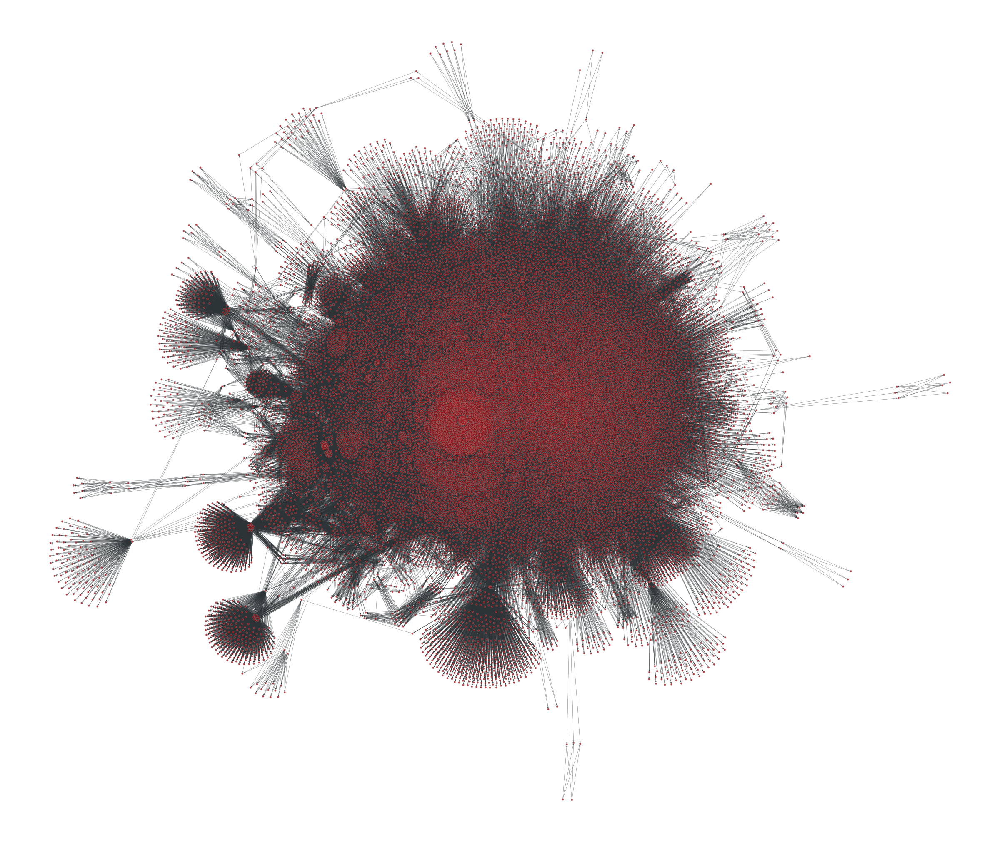

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x39765dac0, at 0x341bc3350>

In [148]:
from graph_tool.all import *
import matplotlib
import numpy as np

g = extract_largest_component(g, directed=False)
pos = sfdp_layout(g)


dprms = dict(fmt="png",  output_size=(1200, 1200))

graph_draw(g, pos, **dprms)
        #    , vertex_fill_color=g.vp.value, vcmap=matplotlib.cm.coolwarm,
        #    vcnorm=matplotlib.colors.Normalize(vmin=0, vmax=1), **dprms)

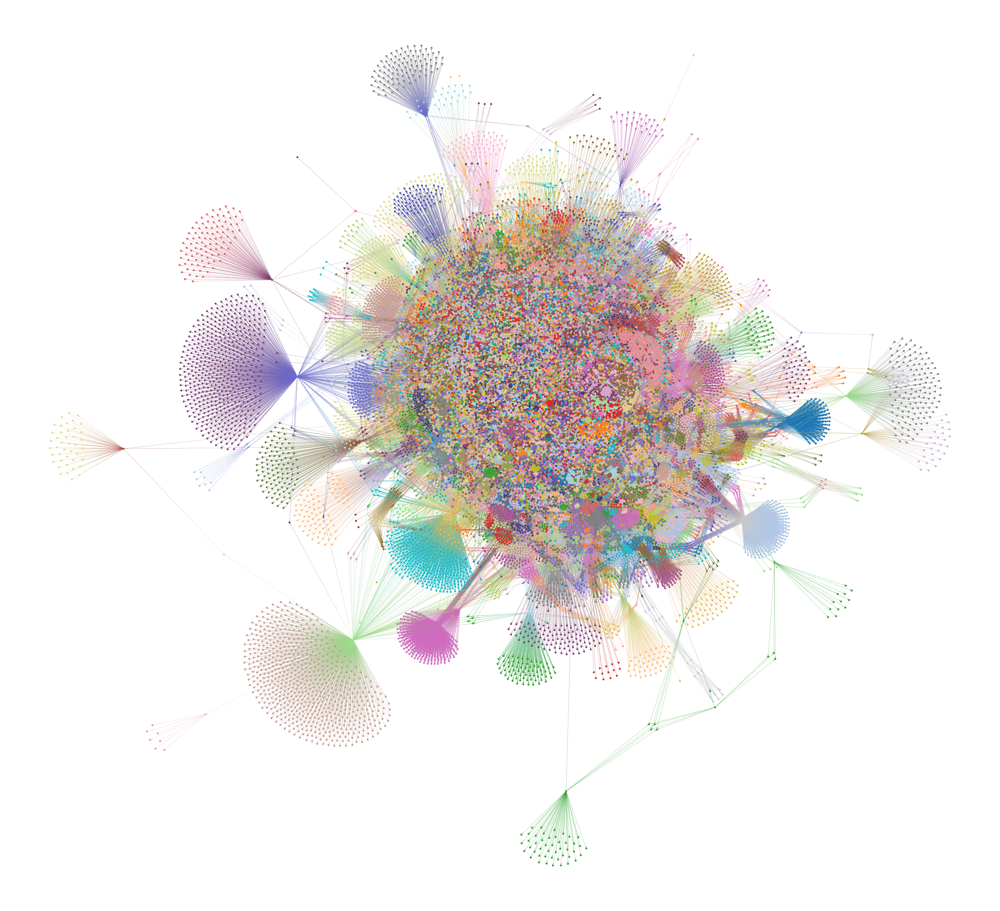

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x38ff3aa50, at 0x2dcc88140>

In [137]:
state = minimize_nested_blockmodel_dl(g)
state.levels[0].draw(pos=pos, **dprms)

In [138]:
pos2 = sfdp_layout(g, groups=state.levels[0].b, gamma=.04) 


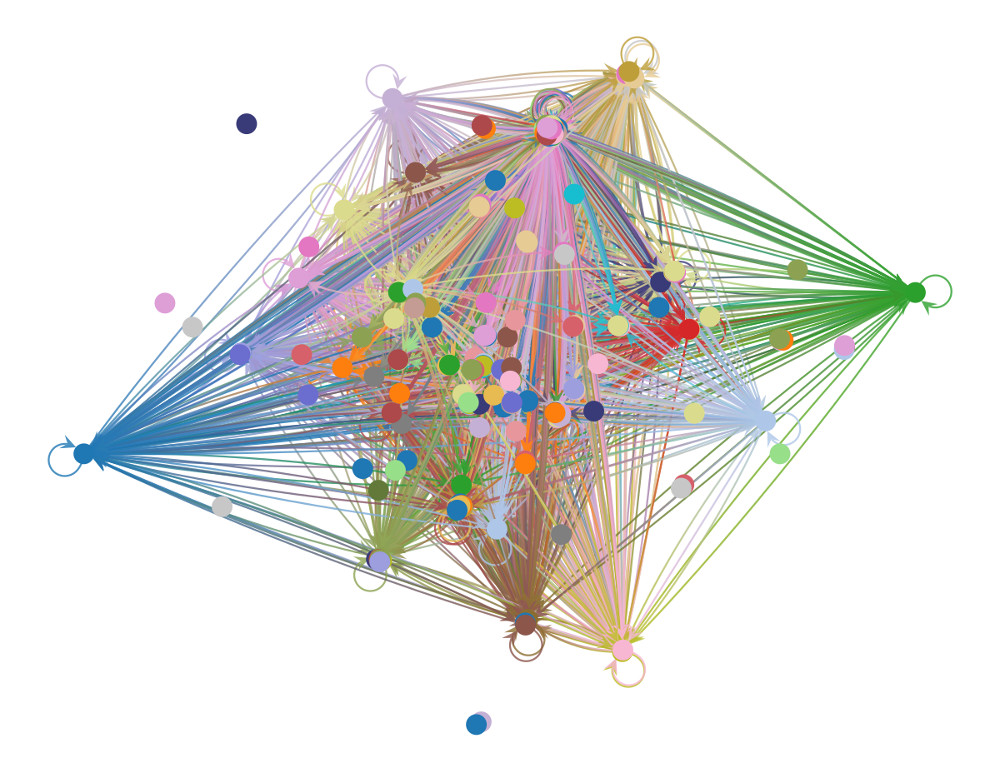

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x3c6ca1520, at 0x2dcb1b170>

In [151]:
state.levels[3].draw(pos=pos2)#, edge_gradient=[], edge_color="#33333322", **dprms)

In [23]:
[x for x in state.levels[0].b]

[1249,
 4264,
 4264,
 4264,
 4264,
 4264,
 4264,
 4264,
 4264,
 4698,
 4264,
 3840,
 3110,
 3110,
 3110,
 3110,
 3110,
 3110,
 3110,
 3110,
 1143,
 3110,
 1825,
 832,
 832,
 832,
 832,
 832,
 832,
 832,
 832,
 832,
 832,
 2747,
 1825,
 1825,
 1825,
 69,
 1825,
 1825,
 1825,
 1825,
 1825,
 1825,
 1342,
 1342,
 1342,
 1342,
 1342,
 1342,
 1342,
 1342,
 1342,
 1342,
 1342,
 832,
 832,
 187,
 832,
 832,
 187,
 832,
 187,
 832,
 832,
 832,
 69,
 4697,
 69,
 4697,
 4697,
 5175,
 4697,
 4697,
 4697,
 4697,
 2747,
 1825,
 2347,
 1825,
 1825,
 1825,
 1825,
 1249,
 4264,
 1825,
 4264,
 4264,
 4264,
 4264,
 4264,
 2996,
 4264,
 4264,
 3110,
 3840,
 3840,
 3840,
 3840,
 3840,
 3840,
 3840,
 3840,
 3840,
 5123,
 5123,
 5123,
 5123,
 5123,
 5123,
 5123,
 5123,
 5123,
 5123,
 5123,
 1825,
 832,
 832,
 832,
 832,
 832,
 832,
 832,
 832,
 5048,
 5048,
 5048,
 1342,
 5048,
 5048,
 5048,
 1342,
 5048,
 1342,
 5048,
 5048,
 5048,
 5048,
 5048,
 5048,
 5048,
 5048,
 5048,
 5048,
 1342,
 3110,
 1342,
 69,
 

In [1]:
!mamba install -c conda-forge graph-tool

zsh:1: command not found: mamba


In [8]:
import graph_tool

ModuleNotFoundError: No module named 'graph_tool'